pybcn: https://pybcn.org/ 

Our code of conduct: https://pybcn.org/coc/

# Introduction to Computer Vision

In this workshop we are going to work with different Python libraries with image manipulation support:

* Numpy  
* Matplotlib: 

    `pip install matplotlib`

* Pillow (PIL):

    `pip install pillow`

* OpenCV:

  https://docs.opencv.org/3.4.6/df/d65/tutorial_table_of_content_introduction.html

* Scikit image

    `pip install scikit-image`
 
* Dlib

    `pip install dlib`




   




## 1. How an image looks like? What it's made of?

Everybody have seen images but how are they internally and how can be modified or how can we obtain information from them? This is a question that we are trying to solve during this workshop.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

image = plt.imread('Images/camera_BW.jpg')

Images are composed by matrixs of values from 0 to 255 (8 bits coded):

In [2]:
image

array([[ 23,  23,  23, ..., 104, 104, 104],
       [ 23,  23,  23, ..., 104, 104, 104],
       [ 23,  23,  23, ..., 104, 104, 104],
       ...,
       [102, 103, 104, ...,  81,  82,  82],
       [103, 104, 105, ...,  79,  80,  80],
       [103, 104, 105, ...,  79,  80,  80]], dtype=uint8)

In [3]:
type(image)

numpy.ndarray

In [4]:
image.shape

(426, 640)

In [5]:
image.size

272640

In [6]:
image.min(), image.max()

(0, 255)

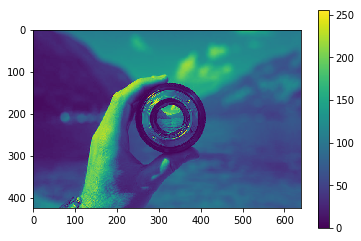

In [7]:
plt.imshow(image)
#cmap='viridis' by default.
#plt.imshow(image,cmap='gray')
plt.colorbar()

255


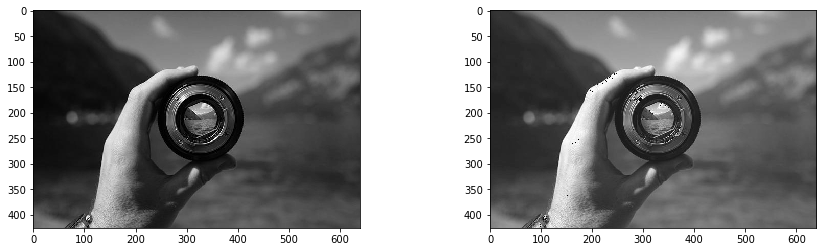

In [8]:
f = plt.figure(figsize=(15,4))

ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)

image_light = image + 25
print(image_light.max()) #1 bytes goes from 0 to 255, overflow!!!
ax1.imshow(image,cmap='gray')
ax2.imshow(image_light,cmap='gray')

46000

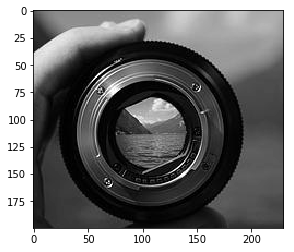

In [9]:
piece = image[100:300,220:450] #slice
plt.imshow(piece,cmap='gray')
piece.size

And with a color image? How many colors are defined?

In [10]:
image_color = plt.imread('Images/camera_RBG.jpg')

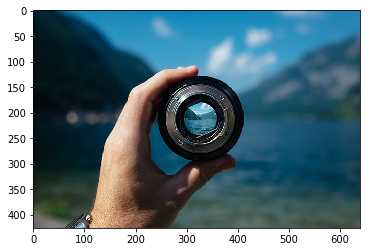

In [11]:
plt.imshow(image_color)

In [12]:
image_color

array([[[  0,  31,  42],
        [  0,  32,  43],
        [  1,  33,  44],
        ...,
        [ 30, 127, 178],
        [ 30, 127, 178],
        [ 30, 127, 178]],

       [[  0,  31,  42],
        [  0,  32,  43],
        [  1,  33,  44],
        ...,
        [ 30, 127, 178],
        [ 30, 127, 178],
        [ 30, 127, 178]],

       [[  0,  31,  42],
        [  0,  32,  43],
        [  0,  32,  43],
        ...,
        [ 31, 128, 179],
        [ 31, 128, 179],
        [ 31, 128, 179]],

       ...,

       [[103, 102, 100],
        [104, 103, 101],
        [104, 103, 101],
        ...,
        [ 73,  87,  74],
        [ 73,  87,  74],
        [ 74,  88,  75]],

       [[104, 103, 101],
        [104, 103, 101],
        [105, 104, 102],
        ...,
        [ 71,  85,  72],
        [ 72,  86,  73],
        [ 73,  87,  74]],

       [[104, 103, 101],
        [104, 103, 101],
        [105, 104, 102],
        ...,
        [ 71,  85,  72],
        [ 71,  85,  72],
        [ 72,  86,  73]]

In [13]:
image_color.shape

(426, 640, 3)

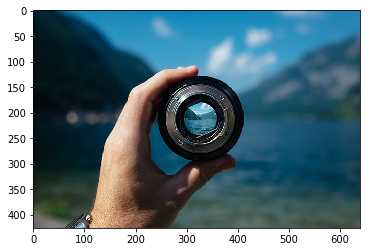

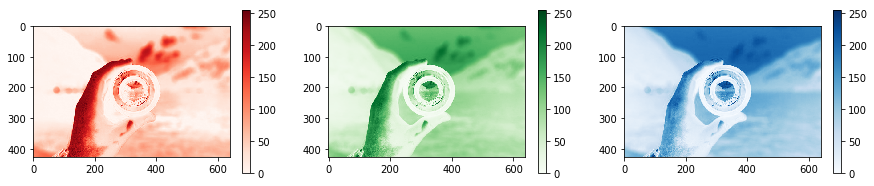

In [14]:
plt.imshow(image_color)
f = plt.figure(figsize=(15,3))

ax1 = f.add_subplot(131)
ax2 = f.add_subplot(132)
ax3 = f.add_subplot(133)
image_color[:,:,0]
red=ax1.imshow(image_color[:,:,0],cmap = 'Reds')
f.colorbar(red,ax=ax1)
green = ax2.imshow(image_color[:,:,1],cmap = 'Greens')
f.colorbar(green,ax=ax2)
blue = ax3.imshow(image_color[:,:,2],cmap = 'Blues')
f.colorbar(blue,ax=ax3)


## 2. Especific libraries for images : Pillow (PIL)

In [15]:
from PIL import Image
from IPython.display import display #for display in IPython Notebook

In [16]:
im = Image.open('Images/camera_RBG.jpg')

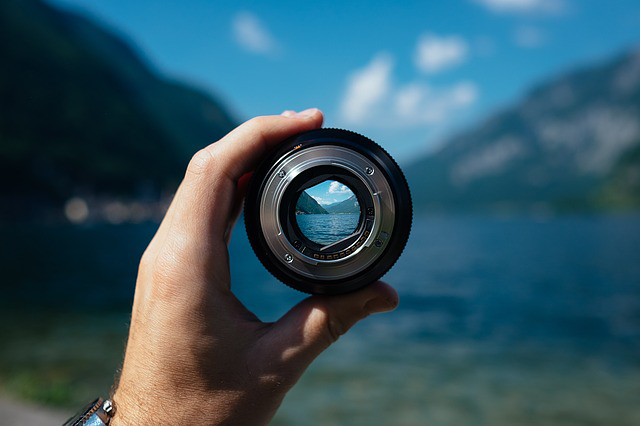

In [17]:
display(im)
#im.show()

We can obtain some information about opened image:

### 2.1 Basic Functions and parameters

In [18]:
im.format, im.size, im.mode, im.layers

('JPEG', (640, 426), 'RGB', 3)

In [19]:
box = (200,100,450,300)
region = im.crop(box)

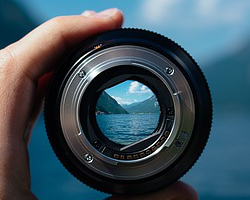

In [20]:
display(region)

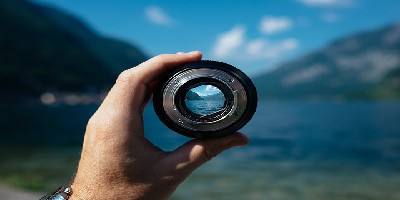

In [21]:
im_resize = im.resize((400, 200))
display(im_resize)

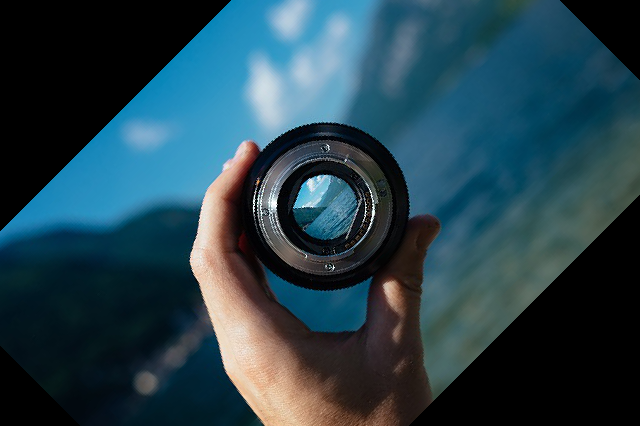

In [22]:
im_rotate_45 = im.rotate(45)
display(im_rotate_45)

 ### 2.2 Image color manipulation:   Equalize

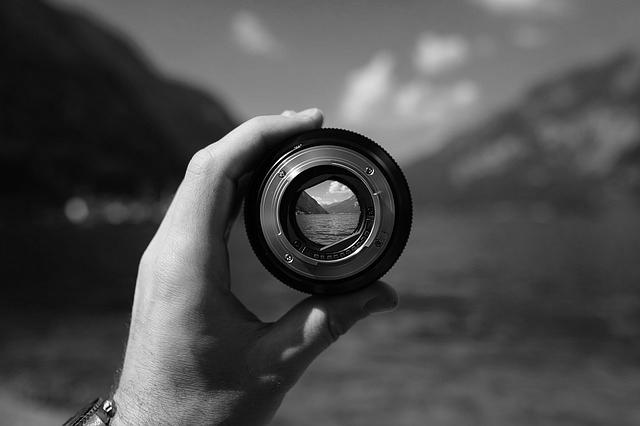

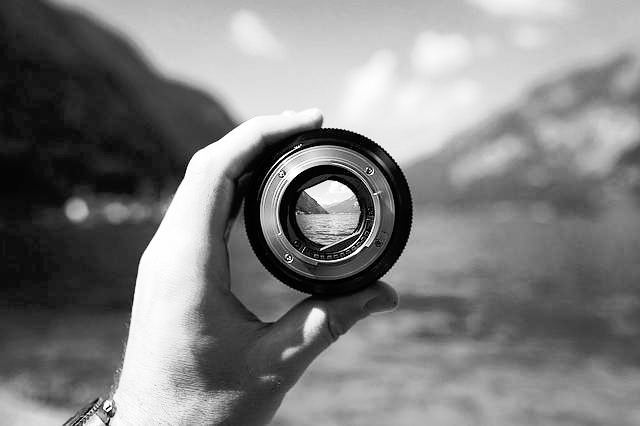

Help on function equalize in PIL.ImageOps:

PIL.ImageOps.equalize = equalize(image, mask=None)
    Equalize the image histogram. This function applies a non-linear
    mapping to the input image, in order to create a uniform
    distribution of grayscale values in the output image.
    
    :param image: The image to equalize.
    :param mask: An optional mask.  If given, only the pixels selected by
                 the mask are included in the analysis.
    :return: An image.



In [23]:
from PIL import ImageOps, Image

im1 = Image.open('Images/camera_BW.jpg')
im2 = ImageOps.equalize(im1)

display(im1)
display(im2)
help ("PIL.ImageOps.equalize")

<StemContainer object of 3 artists>

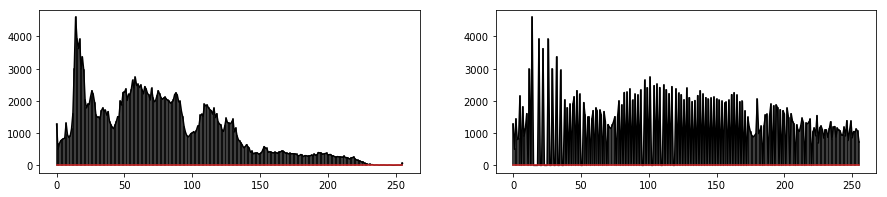

In [24]:
import numpy as np 

f = plt.figure(figsize=(15,3))

ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)

ax1.stem(im1.histogram(),linefmt = 'k-',markerfmt = 'k')
ax2.stem(im2.histogram(), linefmt = 'k-',markerfmt = 'k')

(2048, 1536)
(682, 512)


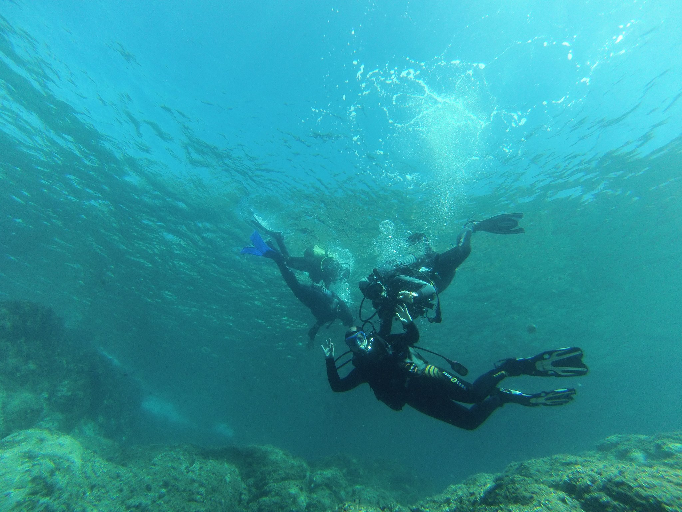

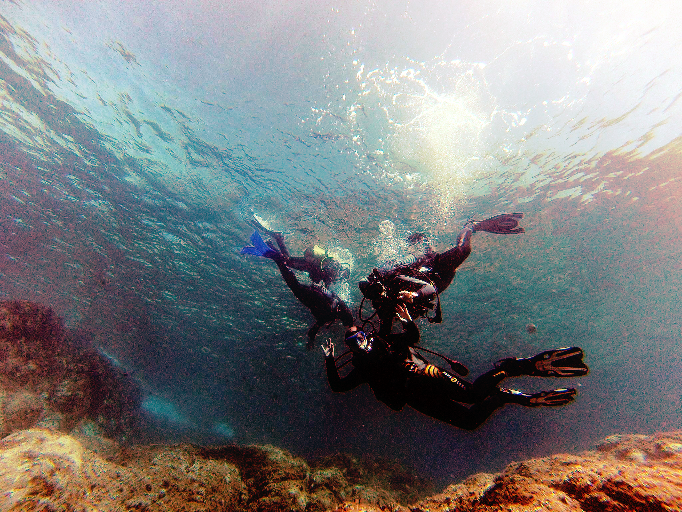

In [25]:
im1 = Image.open('Images/underwater.jpg')

print (im1.size)
im1_r = im1.resize((im1.width//3,im1.height//3))
print (im1_r.size)

im2_r = ImageOps.equalize(im1_r)

display(im1_r)
display(im2_r)

![](https://manoa.hawaii.edu/exploringourfluidearth/sites/default/files/Fig9.7-LightPenetration.jpg)

<StemContainer object of 3 artists>

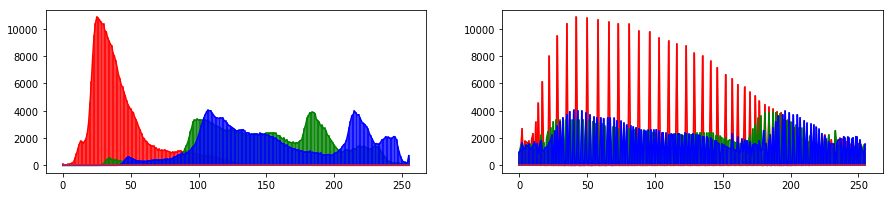

In [26]:
import numpy as np 

f = plt.figure(figsize=(15,3))

ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)


p = 256
ax1.stem(im1_r.histogram()[0:p*1],linefmt = 'r-',markerfmt = 'r') #R
ax2.stem(im2_r.histogram()[0:p*1], linefmt = 'r-',markerfmt = 'r')

ax1.stem(im1_r.histogram()[p*1:p*2],linefmt = 'g-',markerfmt = 'g') #G
ax2.stem(im2_r.histogram()[p*1:p*2], linefmt = 'g-',markerfmt = 'g')

ax1.stem(im1_r.histogram()[p*2:p*3],linefmt = 'b-',markerfmt = 'b') #B
ax2.stem(im2_r.histogram()[p*2:p*3], linefmt = 'b-',markerfmt = 'b')


 ### 2.3 Image color manipulation:   Filters

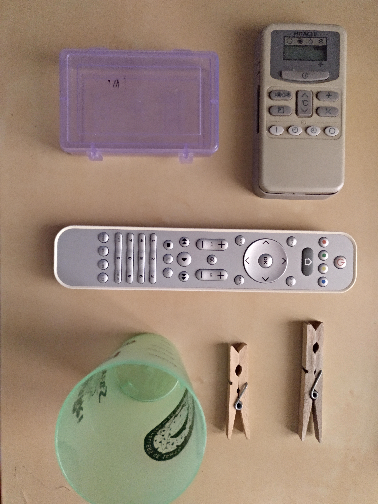

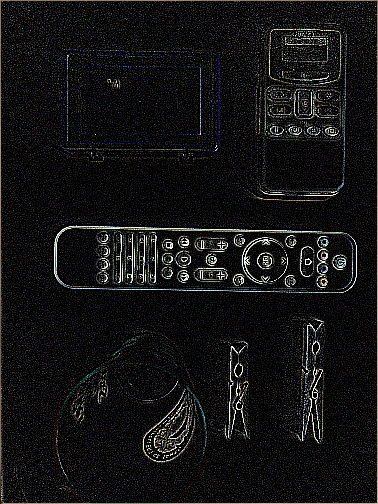

Help on method filter in module PIL.Image:

filter(filter) method of PIL.JpegImagePlugin.JpegImageFile instance
    Filters this image using the given filter.  For a list of
    available filters, see the :py:mod:`~PIL.ImageFilter` module.
    
    :param filter: Filter kernel.
    :returns: An :py:class:`~PIL.Image.Image` object.



In [27]:
from PIL import Image, ImageFilter

image = Image.open('Images/objects.jpg')
image_r = image.resize((image.width//8,image.height//8))

image_edges = image_r.filter(ImageFilter.FIND_EDGES)
display(image_r)
display(image_edges)
help(image.filter)

In [28]:
help(ImageFilter.FIND_EDGES)

Help on class FIND_EDGES in module PIL.ImageFilter:

class FIND_EDGES(BuiltinFilter)
 |  Create a convolution kernel.  The current version only
 |  supports 3x3 and 5x5 integer and floating point kernels.
 |  
 |  In the current version, kernels can only be applied to
 |  "L" and "RGB" images.
 |  
 |  :param size: Kernel size, given as (width, height). In the current
 |                  version, this must be (3,3) or (5,5).
 |  :param kernel: A sequence containing kernel weights.
 |  :param scale: Scale factor. If given, the result for each pixel is
 |                  divided by this value.  the default is the sum of the
 |                  kernel weights.
 |  :param offset: Offset. If given, this value is added to the result,
 |                  after it has been divided by the scale factor.
 |  
 |  Method resolution order:
 |      FIND_EDGES
 |      BuiltinFilter
 |      Kernel
 |      MultibandFilter
 |      Filter
 |      builtins.object
 |  
 |  Data and other attributes define

### 2.3 You can design your own filter

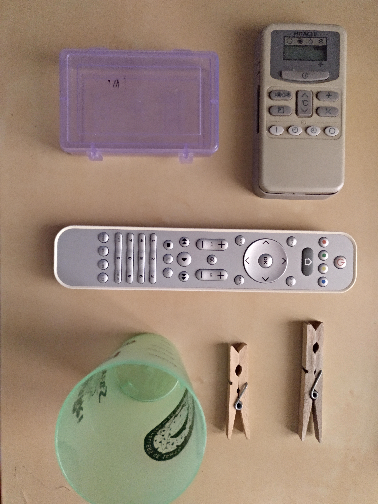

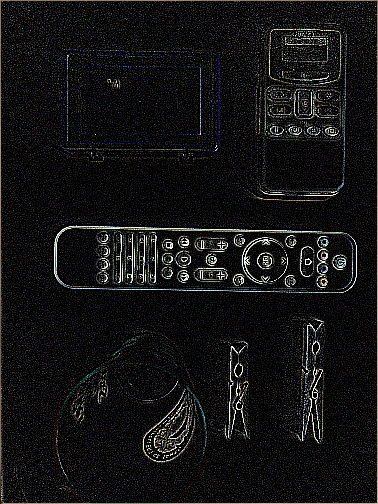

In [29]:
kernel = ImageFilter.Kernel((3, 3),(-1, -1, -1, -1, 8, -1, -1, -1, -1),1,0)
image_kernel = image_r.filter(kernel)
display(image_r)
display(image_kernel)

Help on class Kernel in module PIL.ImageFilter:

class Kernel(MultibandFilter)
 |  Create a convolution kernel.  The current version only
 |  supports 3x3 and 5x5 integer and floating point kernels.
 |  
 |  In the current version, kernels can only be applied to
 |  "L" and "RGB" images.
 |  
 |  :param size: Kernel size, given as (width, height). In the current
 |                  version, this must be (3,3) or (5,5).
 |  :param kernel: A sequence containing kernel weights.
 |  :param scale: Scale factor. If given, the result for each pixel is
 |                  divided by this value.  the default is the sum of the
 |                  kernel weights.
 |  :param offset: Offset. If given, this value is added to the result,
 |                  after it has been divided by the scale factor.
 |  
 |  Method resolution order:
 |      Kernel
 |      MultibandFilter
 |      Filter
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, size, kernel, scale=None, offset=

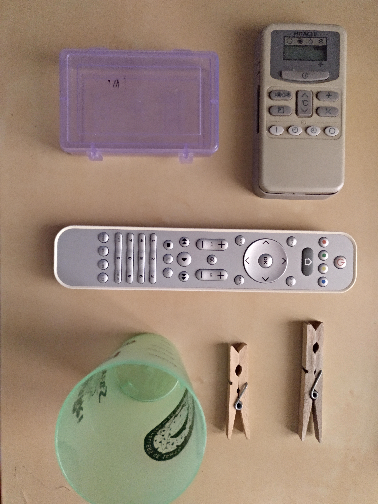

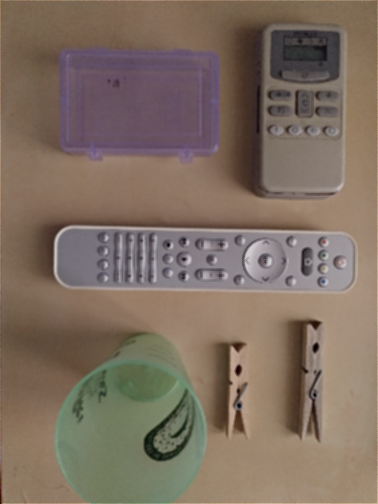

In [30]:
help(ImageFilter.Kernel)
kernel = ImageFilter.Kernel((3, 3), (1, 2, 1, 2, 1, 2, 1, 2, 1),16,0)
image_kernel = image_r.filter(kernel)
display(image_r)
display(image_kernel)

Now, Can you try different kernels and effects?


https://en.wikipedia.org/wiki/Kernel_(image_processing)_

In [31]:
help(ImageFilter)
#Kernel Kata

Help on module PIL.ImageFilter in PIL:

NAME
    PIL.ImageFilter

DESCRIPTION
    # The Python Imaging Library.
    # $Id$
    #
    # standard filters
    #
    # History:
    # 1995-11-27 fl   Created
    # 2002-06-08 fl   Added rank and mode filters
    # 2003-09-15 fl   Fixed rank calculation in rank filter; added expand call
    #
    # Copyright (c) 1997-2003 by Secret Labs AB.
    # Copyright (c) 1995-2002 by Fredrik Lundh.
    #
    # See the README file for information on usage and redistribution.
    #

CLASSES
    builtins.object
        Filter
            ModeFilter
            MultibandFilter
                BoxBlur
                GaussianBlur
                Kernel
                    BuiltinFilter
                        BLUR
                        CONTOUR
                        DETAIL
                        EDGE_ENHANCE
                        EDGE_ENHANCE_MORE
                        EMBOSS
                        FIND_EDGES
                        SHARPEN
        

## 3. OpenCV: Computer Vision. C++ library!!!

3.4.1


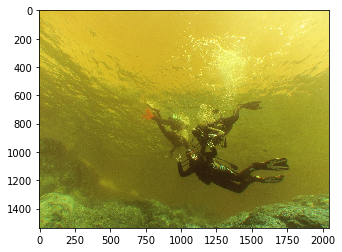

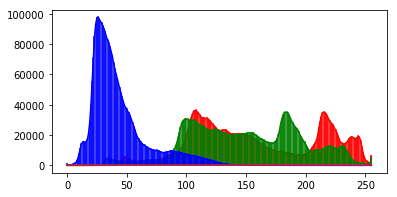

In [71]:
import matplotlib.pyplot as plt
import cv2
print(cv2.__version__)


image = cv2.imread('Images/underwater.jpg')
plt.imshow(image) #WAT!!!

plt.figure(figsize=(6, 3))
cols = ['r','g','b']

for i, c in enumerate(cols):
    histr = cv2.calcHist([image], [i], None, [256], [0, 256])
    plt.stem(histr,linefmt = c+'-',markerfmt = c)
    
plt.show()

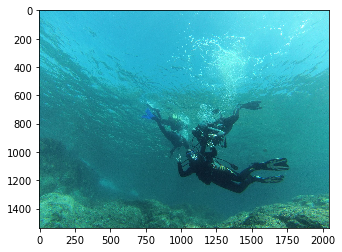

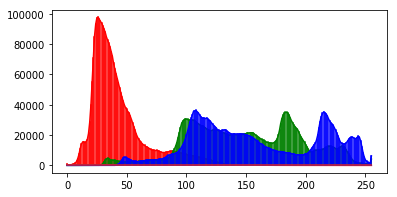

In [33]:
import matplotlib.pyplot as plt
import cv2

img = cv2.imread('Images/underwater.jpg')
image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # BGR TO RGB !!!
plt.imshow(image)

plt.figure(figsize=(6, 3))
cols = ['r','g','b']

for i, c in enumerate(cols):
    histr = cv2.calcHist([image], [i], None, [256], [0, 256])
    plt.stem(histr,linefmt = c+'-',markerfmt = c)
    
plt.show()

### 3.1 Masks: Detect objects by color and size 

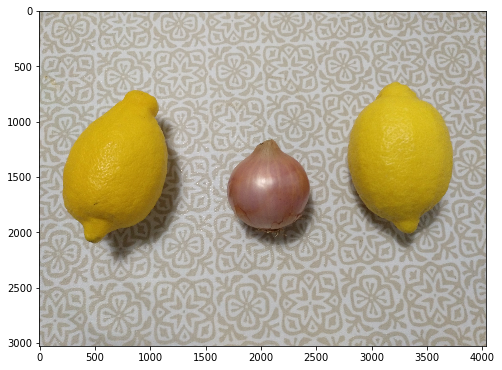

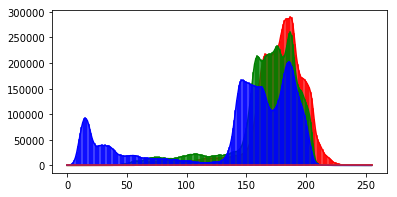

In [34]:
import cv2 
import matplotlib.pyplot as plt

image = cv2.imread('Images/lemon.jpg')
imgRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8,8))
plt.imshow(imgRGB)

plt.figure(figsize=(6, 3))
cols = ['r','g','b']
for i, c in enumerate(cols):
    histr = cv2.calcHist([imgRGB], [i], None, [256], [0, 256])
    plt.stem(histr,linefmt = c+'-',markerfmt = c)

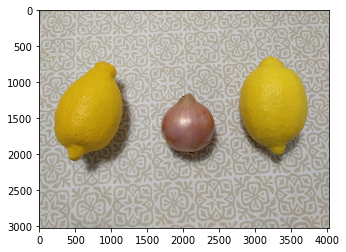

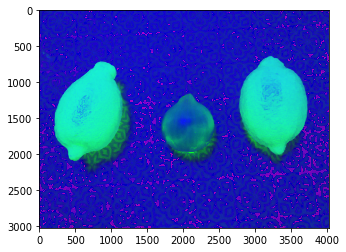

In [35]:
imgBlurRGB = cv2.GaussianBlur(imgRGB, (7, 7), 0) # Smooth the image!
plt.imshow(imgBlurRGB)
plt.show()
imgHSV = cv2.cvtColor(imgBlurRGB, cv2.COLOR_RGB2HSV) #Change the Color Model !
plt.imshow(imgHSV)
plt.show()



![title](Images/RGB-HSV.jpeg)

In [36]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors

imgRGBtiny = cv2.resize(imgBlurRGB,(360,480))


pixel_colors = imgRGBtiny.reshape((np.shape(imgRGBtiny)[0]*np.shape(imgRGBtiny)[1], 3))
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()

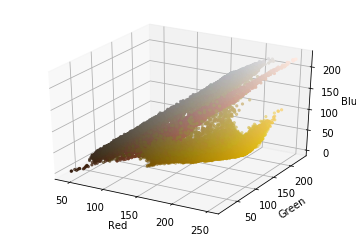

In [37]:
r, g, b = cv2.split(imgRGBtiny)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
plt.show()

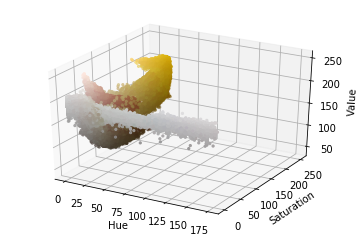

In [38]:
imgHSVtiny = cv2.resize(imgHSV,(360,480))

h, s, v = cv2.split(imgHSVtiny)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Hue")
axis.set_ylabel("Saturation")
axis.set_zlabel("Value")
plt.show()
#Hue range is [0,179], Saturation range is [0,255] and Value range is [0,255]



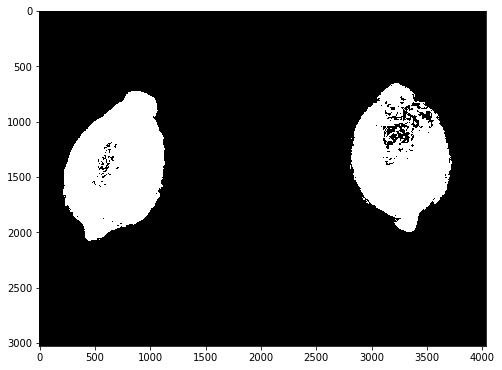

In [39]:
import numpy as np
lower_yellow = np.array([[20, 194, 120]])
upper_yellow = np.array([25, 255, 255])

# Keep only the yellow elements!!
mask = cv2.inRange(imgHSV, lower_yellow, upper_yellow)
plt.figure(figsize=(8,8))
plt.imshow(mask,cmap = 'gray')

In [40]:
# Now Find contours!! we will keep the external points of each contourn 
cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
help (cv2.findContours)

Help on built-in function findContours:

findContours(...)
    findContours(image, mode, method[, contours[, hierarchy[, offset]]]) -> image, contours, hierarchy
    .   @brief Finds contours in a binary image.
    .   
    .   The function retrieves contours from the binary image using the algorithm @cite Suzuki85 . The contours
    .   are a useful tool for shape analysis and object detection and recognition. See squares.cpp in the
    .   OpenCV sample directory.
    .   @note Since opencv 3.2 source image is not modified by this function.
    .   
    .   @param image Source, an 8-bit single-channel image. Non-zero pixels are treated as 1's. Zero
    .   pixels remain 0's, so the image is treated as binary . You can use #compare, #inRange, #threshold ,
    .   #adaptiveThreshold, #Canny, and others to create a binary image out of a grayscale or color one.
    .   If mode equals to #RETR_CCOMP or #RETR_FLOODFILL, the input can also be a 32-bit integer image of labels (CV_32SC1).
   

In [41]:
# cnts[0] -> img, cnts[1] -> contourns:list of points, cnts[2] hierarchy
len(cnts[1])

33

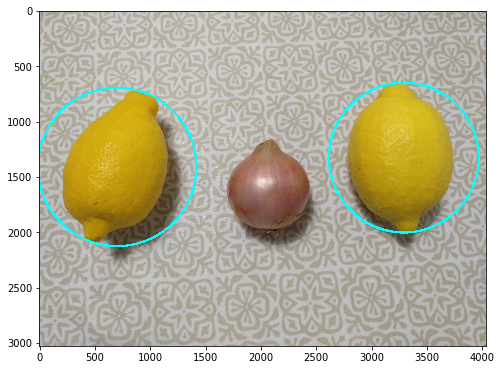

In [42]:
for cnt in cnts[1]:
    ((x, y), radius) = cv2.minEnclosingCircle(cnt) #enclose a list of points in a circle
    if radius > 100:
        cv2.circle(imgRGB, (int(x), int(y)), int(radius),(0, 255, 255), 20)
    
plt.figure(figsize=(8,8))
plt.imshow(imgRGB)

How many red balls are in this image?
![title](Images/balls.jpeg)



In [43]:
#Detecting Objects Kata

### 3.2 Perspective conversions: Photo Scan example

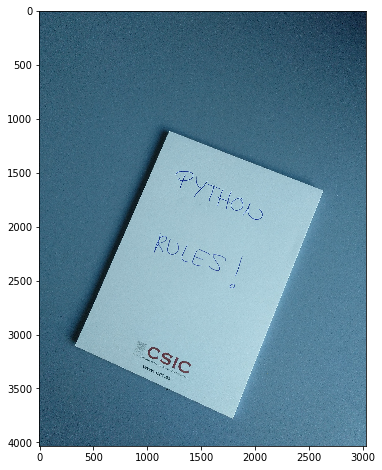

In [44]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

image = cv2.imread('Images/nota.jpg')
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

height, width = image.shape[:2]
im_r = cv2.resize(img,(width, height), interpolation = cv2.INTER_CUBIC)

plt.figure(figsize=(8,8))
plt.imshow(im_r)

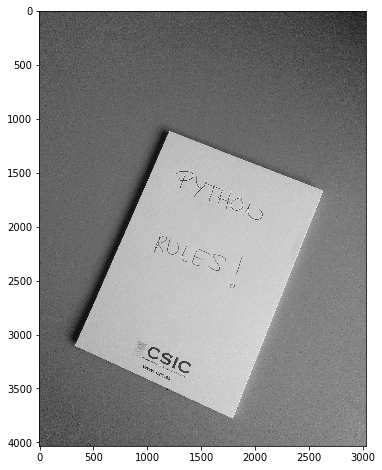

In [45]:
imgray = cv2.cvtColor(im_r,cv2.COLOR_BGR2GRAY) # converts to gray 
plt.figure(figsize=(8,8))
plt.imshow(imgray, cmap='gray')

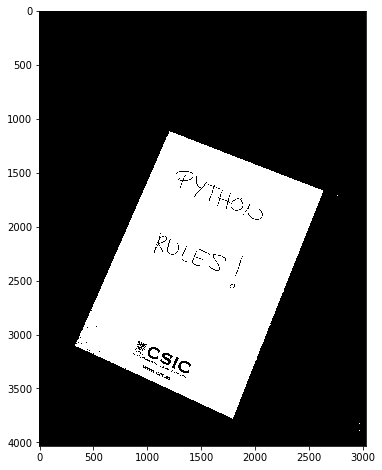

In [46]:
ret,thresh = cv2.threshold(imgray,170,255,cv2.THRESH_BINARY) 
#Everything from 170 goes to 255, using thresh binary (sharp) 

plt.figure(figsize=(8,8))
plt.imshow(thresh, cmap='gray')


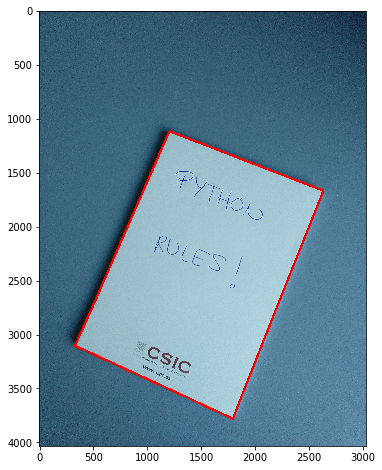

In [47]:
#Find contours! we will keep all the points for the contours

_, contours, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
#sort contours by area
contours = sorted(contours, key = cv2.contourArea, reverse = True)
im_r_copy = im_r.copy()
# draw the first contour, the one with more area.
cont = 0
cv2.drawContours(im_r_copy, contours, cont, (255,0,0), 20)

plt.figure(figsize=(8,8))
plt.imshow(im_r_copy)

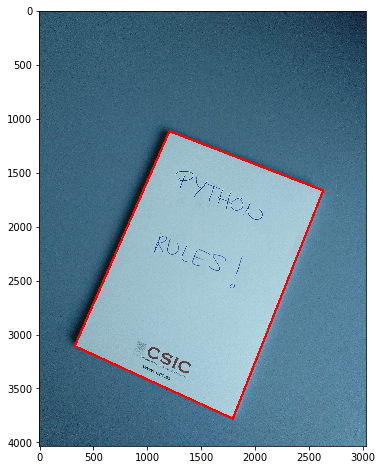

In [48]:
#find edge points from countour.
peri = cv2.arcLength(contours[cont], True)
points = cv2.approxPolyDP(contours[cont], 0.02 * peri, True)

points = points.reshape(4,2)
rect = np.zeros((4,2),dtype = 'float32')
rect[0],rect[1],rect[2],rect[3] = points[0],points[3],points[2],points[1]
(tl, tr, br, bl) = rect

im_r_copy = im_r.copy()
pts = np.array(rect, np.int32)
pts = pts.reshape((-1, 1, 2))
cv2.polylines(im_r_copy,[pts],True,(255,0,0),20)
plt.figure(figsize=(8,8))
plt.imshow(im_r_copy)

In [49]:
#Calculate Euclidean distances for each line.
widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
print("wa", widthA)
widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
print("wb",widthB)

heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
print("ha", heightA)
heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
print("hb",heightB)

maxWidth = max(int(widthA), int(widthB))
maxHeight = max(int(heightA), int(heightB))

points_dst = np.array([[0, 0],[maxWidth, 0],[maxWidth, maxHeight],
                [0, maxHeight]], dtype = "float32")


#calculate perspective transform Matrix
M = cv2.getPerspectiveTransform(rect, points_dst)
print(M)
#apply perspective Transform to thresh using Transform Matrix
scan = cv2.warpPerspective(thresh, M, (maxWidth, maxHeight))


wa 1608.5552523926556
wb 1524.6586503214417
ha 2274.22975972086
hb 2175.704253799215
[[ 1.07281333e+00  4.71240795e-01 -1.81830388e+03]
 [-4.22740550e-01  1.09297648e+00 -7.06657714e+02]
 [ 1.85979330e-05  3.66969279e-05  1.00000000e+00]]


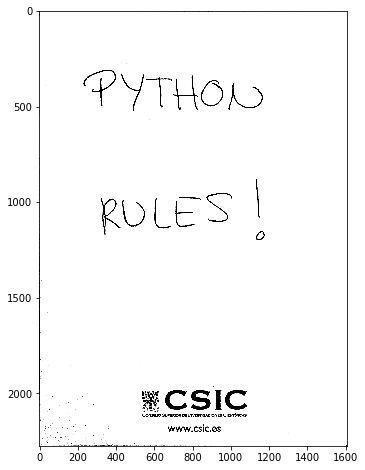

In [50]:
plt.figure(figsize=(8,8))
plt.imshow(scan, cmap = 'gray')

Try to repair this perspective:
![title](Images/plate.jpg)



In [51]:
#Perspective KATA

### 4. Machine Learning with scikit.Image:  Face Detection 

In [52]:
import matplotlib.pyplot as plt
from skimage import io, data, exposure
import numpy as np

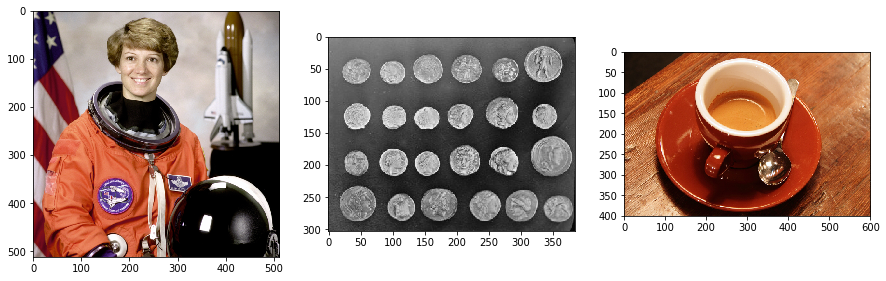

In [53]:
ex1= data.astronaut()
ex2 = data.coins()
ex3 = data.coffee()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 10))

ax1.imshow(ex1)
ax2.imshow(ex2, cmap= 'gray')
ax3.imshow(ex3, cmap = 'gray')

### 4.1 Face Dectection using Haar cascades (Viola & Jones)

![](https://journals.plos.org/plosone/article/figure/image?id=10.1371/journal.pone.0173424.g002&size=large)

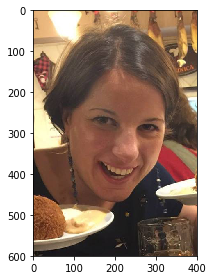

In [54]:
img = io.imread('Images/nuria.jpg')
crop = img[0:600,200:600]
io.imshow(crop)

In [55]:
import cv2

In [56]:
haar_path = '/Users/eloi/opencv/data/haarcascades/haarcascade_frontalface_alt.xml'
faceCascade = cv2.CascadeClassifier(haar_path)

print ("it exists? " +  str(not faceCascade.empty()))

it exists? True


array([[ 86, 187, 276, 276]], dtype=int32)

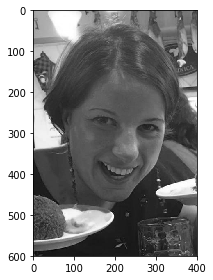

In [57]:
gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
io.imshow(gray)
faces = faceCascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=4, minSize=(50, 50),flags=cv2.CASCADE_SCALE_IMAGE)
faces

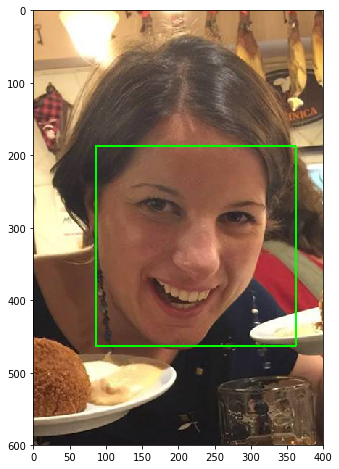

In [58]:
for (x, y, w, h) in faces:
    cv2.rectangle(crop, (x, y), (x+w, y+h), (0, 255, 0), 2)
    
plt.figure(figsize=(8,8))
plt.imshow(crop)

4


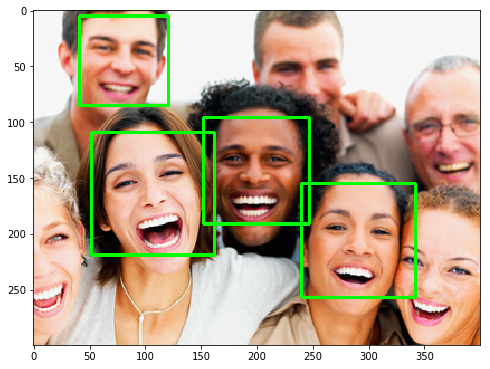

In [59]:
img = io.imread('Images/people.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = faceCascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=4, minSize=(50, 50),flags=cv2.CASCADE_SCALE_IMAGE)

for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
print(len(faces))    
plt.figure(figsize=(8,8))
plt.imshow(img)
#GOOD but it could be better...

### 4.2 Second round: Face Detection Using HOG : Histogram of oriented Gradients 

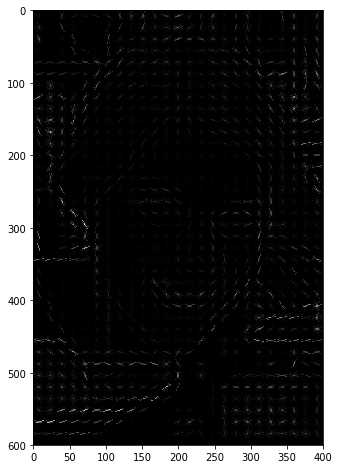

In [60]:
from skimage.feature import hog

img = io.imread('Images/nuria.jpg')
crop = img[0:600,200:600]

#create hog features
fd, hog_image = hog(crop, orientations=8, pixels_per_cell=(16, 16),cells_per_block=(1, 1), visualize=True, multichannel=True, block_norm='L2-Hys')

plt.figure(figsize=(8,8))
plt.imshow(hog_image, cmap = 'gray')

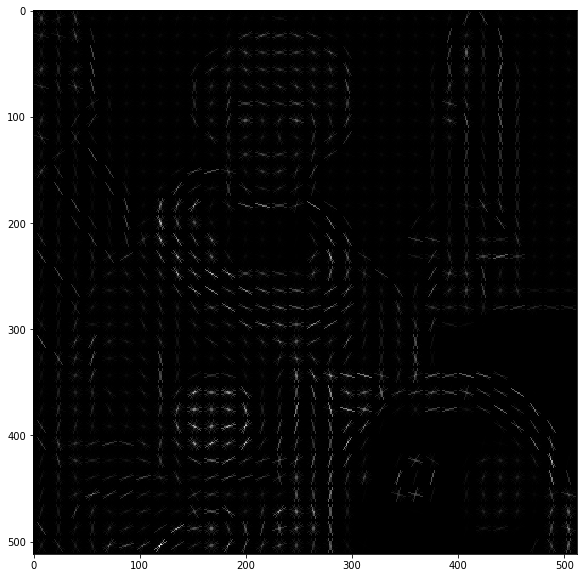

In [61]:
fd, hog_image2 = hog(ex1, orientations=8, pixels_per_cell=(16, 16),cells_per_block=(1, 1), visualize=True, multichannel=True, block_norm='L2-Hys')

plt.figure(figsize=(10,10))
plt.imshow(hog_image2, cmap = 'gray')

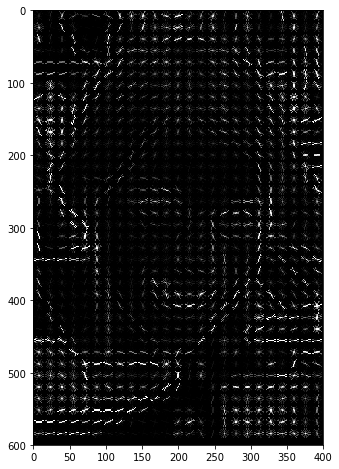

In [62]:
hog_image_r = exposure.rescale_intensity(hog_image, in_range=(0, 12))

plt.figure(figsize=(8,8))
plt.imshow(hog_image_r, cmap = 'gray')

In [63]:
#dlib frontal_face_detector() implementation use HOG features:
import dlib, cv2

detector = dlib.get_frontal_face_detector()
gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
faces = detector(gray, 1)

faces

rectangles[[(82, 171) (349, 439)]]

In [64]:
faces[0].area()

72092

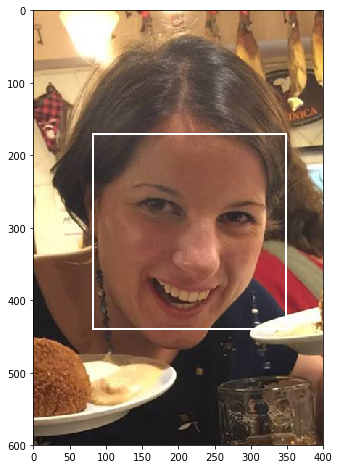

In [65]:
for face in faces:
    pt1,pt2 = face.tl_corner(), face.br_corner() 
    cv2.rectangle(crop, (pt1.x,pt1.y), (pt2.x,pt2.y), (255,255,255), 2)
plt.figure(figsize=(8,8))
plt.imshow(crop)

In [66]:
img = io.imread('Images/people.jpg')

detector = dlib.get_frontal_face_detector()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = detector(gray, 1)
print(len(faces))

6


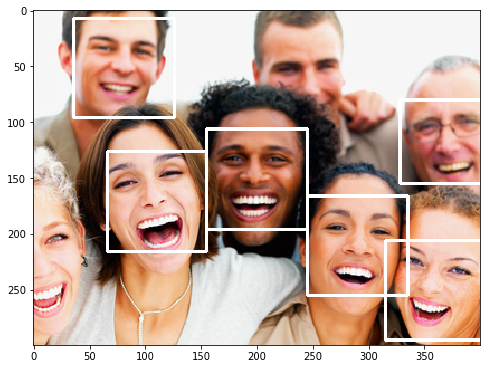

In [67]:

for face in faces:
    pt1,pt2 = face.tl_corner(), face.br_corner() 
    cv2.rectangle(img, (pt1.x,pt1.y), (pt2.x,pt2.y), (255,255,255), 2)

plt.figure(figsize=(8,8))
plt.imshow(img)
#Better Results

### 4.3 Third round: Face Detection DNN : Deep Neural Network

7


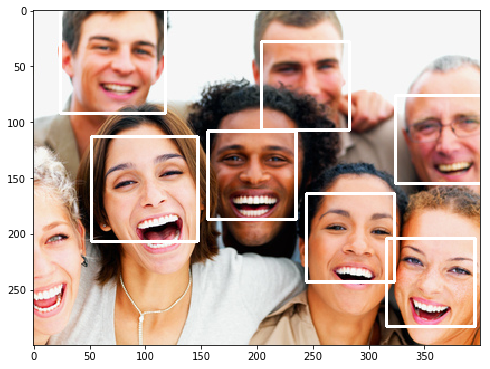

In [68]:
img = io.imread('Images/people.jpg')
dnnFaceDetector = dlib.cnn_face_detection_model_v1("./mmod_human_face_detector.dat")
faceRects = dnnFaceDetector(img,0)
print(len(faceRects))
for faceRect in faceRects:
    x1 = faceRect.rect.left()
    y1 = faceRect.rect.top()
    x2 = faceRect.rect.right()
    y2 = faceRect.rect.bottom()
    cv2.rectangle(img, (x1,y1),(x2,y2), (255,255,255), 2)
    
plt.figure(figsize=(8,8))
plt.imshow(img)
#Well Done!!

Try with this image now:
![title](images/more_people.jpg)


Now try a different model for this image:

![title](images/dogs.jpeg)


https://github.com/davisking/dlib-models

In [69]:
#face detection KATA

In [70]:
#dog detection KATA

### Some related links (tutorial and sources):

* https://www.pyimagesearch.com/  
* https://www.learnopencv.com/  
* https://pillow.readthedocs.io/en/latest/handbook/index.html
* https://github.com/scikit-image/skimage-tutorials